## This notebook calculates drought factor. It requires KBDI and precipitation as input

In [1]:
import xarray as xr
import numpy as np
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
#For the Computation of drought factors
def compute_drought_factor(
    ppt_dir, kbdi_dir, output_dir, start_year, end_year
):
    """
    Compute pixel-wise daily Drought Factor (DF) from NetCDF KBDI and precipitation.

    Parameters:
    -----------
    ppt_dir : str or Path
        Folder containing daily precipitation NetCDF files (1 per year)
    kbdi_dir : str or Path
        Folder containing daily KBDI NetCDF files (1 per year)
    output_dir : str or Path
        Folder to save DF NetCDF outputs
    start_year : int
        First year to process
    end_year : int
        Last year to process
    """
    ppt_dir = Path(ppt_dir)
    kbdi_dir = Path(kbdi_dir)
    output_dir = Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)

    def compute_x(P, N):
        """Compute rainfall effect factor x"""
        x = xr.ones_like(P)
        mask1 = (N <= 1) & (P > 2)
        mask2 = (N == 0) & (P > 2)
        x = xr.where(mask1, (N**1.3) / ((N**1.3) + (P - 2)), x)
        x = xr.where(mask2, (0.8**1.3) / ((0.8**1.3) + (P - 2)), x)
        return x

    prev_rainfall = None

    for year in range(start_year, end_year + 1):
        print(f"\nProcessing year {year}...")

        ppt_file = ppt_dir / f"{year}.nc"
        kbdi_file = kbdi_dir / f"KBDI_Queensland_{year}.nc"
        output_file = output_dir / f"DF_Queensland_{year}.nc"

        # Load NetCDFs
        ppt_ds = xr.open_dataset(ppt_file)
        kbdi_ds = xr.open_dataset(kbdi_file)

        ppt = ppt_ds["tp"] * 1000.0  # meters → mm
        kbdi = kbdi_ds["KBDI"]

        # Align dimensions
        ppt, kbdi = xr.align(ppt, kbdi, join="inner")

        # Initialize previous rainfall
        if prev_rainfall is None:
            prev_rainfall = xr.zeros_like(ppt.isel(valid_time=0))

        df_list = []

        for t in range(ppt.sizes["valid_time"]):
            ppt_day = ppt.isel(valid_time=t)
            kbdi_day = kbdi.isel(valid_time=t)

            # Compute rainfall effect
            x = compute_x(ppt_day, prev_rainfall)

            # Compute Drought Factor
            DF = 10.5 * (1 - np.exp(-(kbdi_day + 30) / 40)) * ((41 * x**2 + x) / (40 * x**2 + x + 1))

            # Update prev_rainfall
            prev_rainfall = ppt_day

            df_list.append(DF)

        # Combine daily DF
        df_da = xr.concat(df_list, dim="valid_time")
        df_da = df_da.assign_coords(valid_time=ppt.valid_time)

        # Convert to dataset
        df_ds = df_da.to_dataset(name="DF")
        df_ds.attrs.update({
            "description": "Daily Drought Factor (DF) computed from KBDI and precipitation",
            "units": "unitless",
            "KBDI_units": "mm",
            "precipitation_units": "mm"
        })

        # Save NetCDF
        df_ds.to_netcdf(output_file)
        print(f"Saved DF file: {output_file}")

    print("\nDrought Factor Calculation Complete!")


In [3]:
#The drought factor is computed in two parts for greater efficiency
compute_drought_factor(
    ppt_dir="Data/Total Precipitation ERA5",
    kbdi_dir="Outputs/KBDI_Output",
    output_dir="Outputs/DF_Output",
    start_year=2013,
    end_year=2018
)

# Then for the next chunk (2019–2023), it continues pixel-wise
compute_drought_factor(
    ppt_dir="Data/Total Precipitation ERA5",
    kbdi_dir="Outputs/KBDI_Output",
    output_dir="Outputs/DF_Output",
    start_year=2019,
    end_year=2023
)


Processing year 2013...
Saved DF file: Outputs/DF_Output/DF_Queensland_2013.nc

Processing year 2014...
Saved DF file: Outputs/DF_Output/DF_Queensland_2014.nc

Processing year 2015...
Saved DF file: Outputs/DF_Output/DF_Queensland_2015.nc

Processing year 2016...
Saved DF file: Outputs/DF_Output/DF_Queensland_2016.nc

Processing year 2017...
Saved DF file: Outputs/DF_Output/DF_Queensland_2017.nc

Processing year 2018...
Saved DF file: Outputs/DF_Output/DF_Queensland_2018.nc

Drought Factor Calculation Complete!

Processing year 2019...
Saved DF file: Outputs/DF_Output/DF_Queensland_2019.nc

Processing year 2020...
Saved DF file: Outputs/DF_Output/DF_Queensland_2020.nc

Processing year 2021...
Saved DF file: Outputs/DF_Output/DF_Queensland_2021.nc

Processing year 2022...
Saved DF file: Outputs/DF_Output/DF_Queensland_2022.nc

Processing year 2023...
Saved DF file: Outputs/DF_Output/DF_Queensland_2023.nc

Drought Factor Calculation Complete!


In [4]:
#For validation checks
df_file = "Outputs/DF_Output/DF_Queensland_2014.nc"
df_ds = xr.open_dataset(df_file)
df = df_ds["DF"]

print("DF min:", float(df.min()))
print("DF max:", float(df.max()))
print("DF mean:", float(df.mean()))

DF min: 4.583513509714976e-05
DF max: 10.466803550720215
DF mean: 9.63449478149414


In [5]:
#The drought factor range suggests accurate results have been attained

Loading Outputs/DF_Output/DF_Queensland_2013.nc...
Loading Outputs/DF_Output/DF_Queensland_2014.nc...
Loading Outputs/DF_Output/DF_Queensland_2015.nc...
Loading Outputs/DF_Output/DF_Queensland_2016.nc...
Loading Outputs/DF_Output/DF_Queensland_2017.nc...
Loading Outputs/DF_Output/DF_Queensland_2018.nc...
Loading Outputs/DF_Output/DF_Queensland_2019.nc...
Loading Outputs/DF_Output/DF_Queensland_2020.nc...
Loading Outputs/DF_Output/DF_Queensland_2021.nc...
Loading Outputs/DF_Output/DF_Queensland_2022.nc...
Loading Outputs/DF_Output/DF_Queensland_2023.nc...


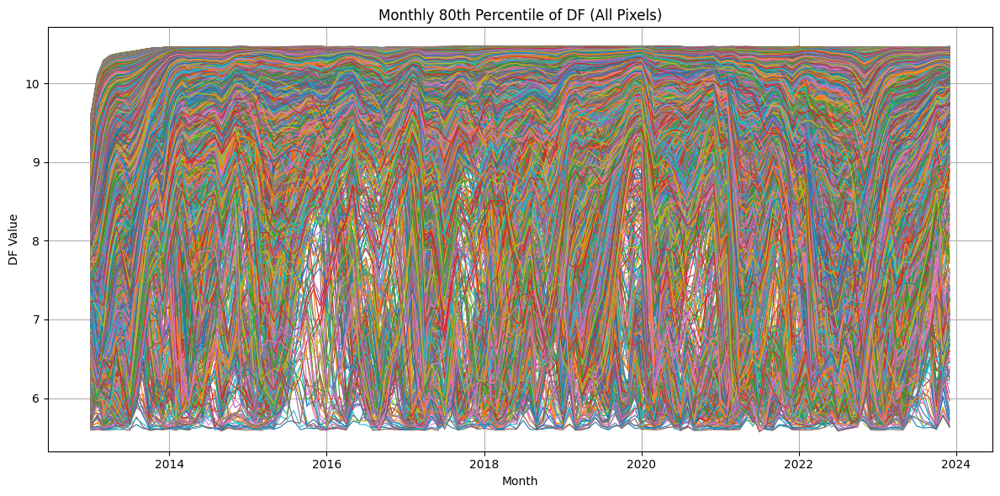

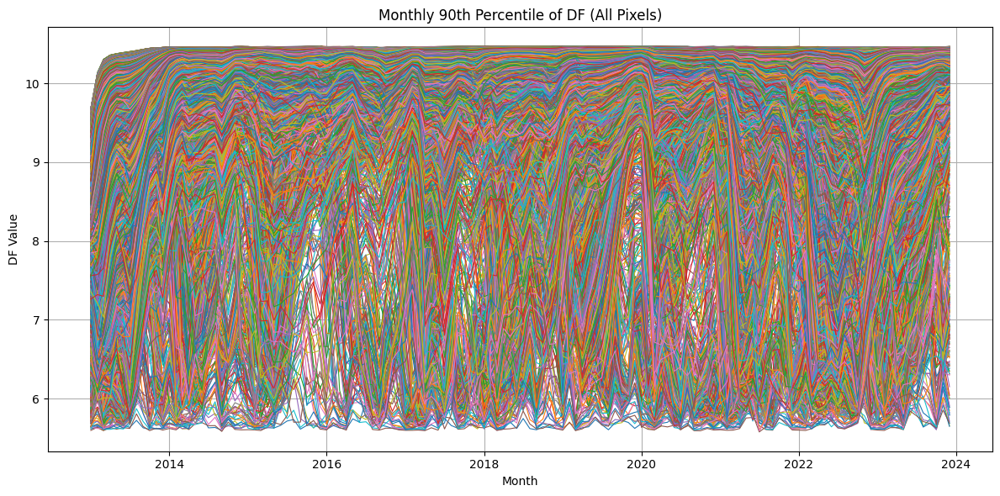

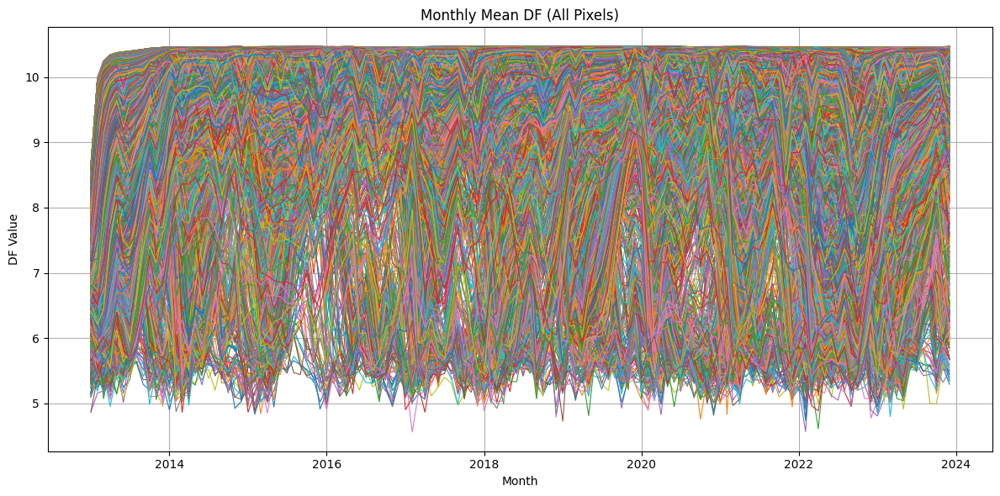

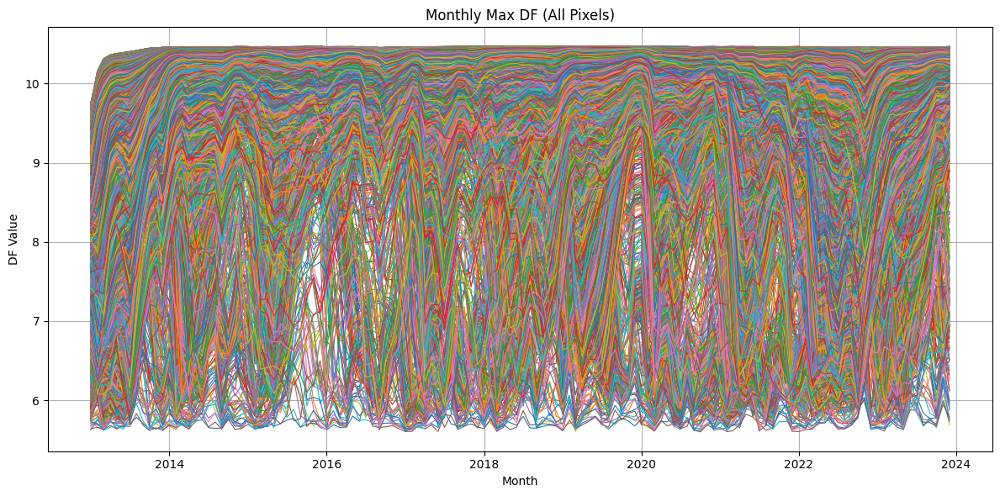


✅ Done! Plotted 4 separate graphs (80th, 90th, mean, max), each line = one pixel.


In [6]:
#Function to plot the results of drought factor for all 10 years
def summarize_df_statistics(df_nc_dir, start_year, end_year):
    """
    Summarize daily Drought Factor (DF) NetCDF files into monthly statistics
    and plot timeseries for all pixels.

    Parameters
    ----------
    df_nc_dir : str or Path
        Folder containing DF NetCDF files (DF_Queensland_YYYY.nc)
    start_year : int
        First year to process
    end_year : int
        Last year to process
    """

    df_nc_dir = Path(df_nc_dir)
    df_list = []

    # ----------------------------
    # 1) Load all yearly DF NetCDFs and concatenate
    # ----------------------------
    for year in range(start_year, end_year + 1):
        nc_file = df_nc_dir / f"DF_Queensland_{year}.nc"
        print(f"Loading {nc_file}...")
        ds = xr.open_dataset(nc_file)
        df_da = ds["DF"]  # daily DF, dims: valid_time x latitude x longitude
        df_list.append(df_da)

    # Concatenate all years along time
    df_all = xr.concat(df_list, dim="valid_time")
    df_all = df_all.sortby("valid_time")

    # ----------------------------
    # 2) Resample to monthly statistics per pixel
    # ----------------------------
    monthly_80   = df_all.resample(valid_time="MS").quantile(0.8, dim="valid_time", skipna=True)
    monthly_90   = df_all.resample(valid_time="MS").quantile(0.9, dim="valid_time", skipna=True)
    monthly_mean = df_all.resample(valid_time="MS").mean(dim="valid_time", skipna=True)
    monthly_max  = df_all.resample(valid_time="MS").max(dim="valid_time", skipna=True)

    # ----------------------------
    # 3) Plot helper function
    # ----------------------------
    def plot_all_pixels(da, title_str):
        """
        Plots each pixel's monthly timeseries from da (time, lat, lon) in one figure.
        """
        da_stacked = da.stack(pixel=("latitude", "longitude"))
        plt.figure(figsize=(12, 6))
        for px in da_stacked.pixel:
            series = da_stacked.sel(pixel=px)
            plt.plot(series.valid_time.values, series.values, linewidth=0.8)
        plt.title(title_str)
        plt.xlabel("Month")
        plt.ylabel("DF Value")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    # ----------------------------
    # 4) Plot all statistics
    # ----------------------------
    plot_all_pixels(monthly_80, "Monthly 80th Percentile of DF (All Pixels)")
    plot_all_pixels(monthly_90, "Monthly 90th Percentile of DF (All Pixels)")
    plot_all_pixels(monthly_mean, "Monthly Mean DF (All Pixels)")
    plot_all_pixels(monthly_max, "Monthly Max DF (All Pixels)")

    print("\n✅ Done! Plotted 4 separate graphs (80th, 90th, mean, max), each line = one pixel.")

# ----------------------------
# Usage
# ----------------------------
summarize_df_statistics(
    df_nc_dir="Outputs/DF_Output",  # folder with DF NetCDFs
    start_year=2013,
    end_year=2023
)


Loading Outputs/DF_Output/DF_Queensland_2013.nc...
Loading Outputs/DF_Output/DF_Queensland_2014.nc...
Loading Outputs/DF_Output/DF_Queensland_2015.nc...
Loading Outputs/DF_Output/DF_Queensland_2016.nc...
Loading Outputs/DF_Output/DF_Queensland_2017.nc...
Loading Outputs/DF_Output/DF_Queensland_2018.nc...
Loading Outputs/DF_Output/DF_Queensland_2019.nc...
Loading Outputs/DF_Output/DF_Queensland_2020.nc...
Loading Outputs/DF_Output/DF_Queensland_2021.nc...
Loading Outputs/DF_Output/DF_Queensland_2022.nc...
Loading Outputs/DF_Output/DF_Queensland_2023.nc...


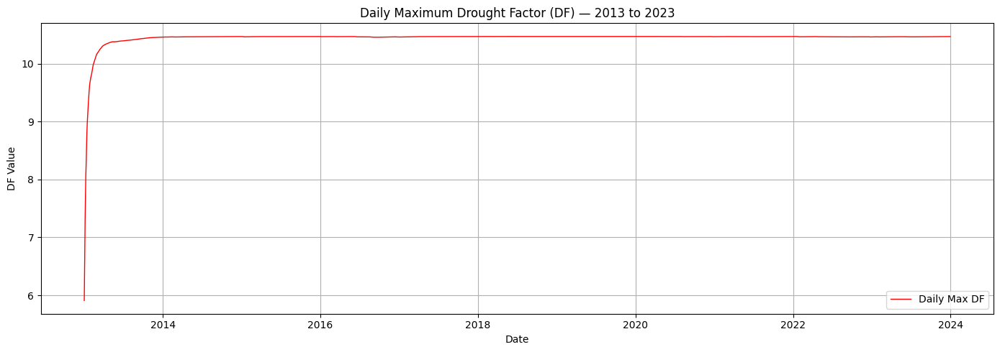

In [8]:
# Graph to plot results of maximum drought factor
# ----------------------------
# User parameters
# ----------------------------
DF_DIR = Path("Outputs/DF_Output")  # Folder with DF NetCDF files: DF_Queensland_YYYY.nc
START_YEAR = 2013
END_YEAR = 2023
OUTPUT_PLOT = "daily_max_df_2013_2023.png"
# ----------------------------
# Load and concatenate DF NetCDFs
# ----------------------------
df_list = []
for year in range(START_YEAR, END_YEAR + 1):
    nc_file = DF_DIR / f"DF_Queensland_{year}.nc"
    print(f"Loading {nc_file}...")
    ds = xr.open_dataset(nc_file)
    df_da = ds["DF"]  # daily DF: dims (valid_time, latitude, longitude)
    df_list.append(df_da)

df_all = xr.concat(df_list, dim="valid_time").sortby("valid_time")

# Compute daily maximum DF across all pixels
# ----------------------------
daily_max_df = df_all.max(dim=("latitude", "longitude"), skipna=True)

# ----------------------------
# Plot daily maximum DF
# ----------------------------
plt.figure(figsize=(14,5))
plt.plot(daily_max_df.valid_time, daily_max_df.values, color="r", linewidth=1, label="Daily Max DF")
plt.xlabel("Date")
plt.ylabel("DF Value")
plt.title(f"Daily Maximum Drought Factor (DF) — {START_YEAR} to {END_YEAR}")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig(OUTPUT_PLOT, dpi=150)
plt.show()


Loading Outputs/DF_Output/DF_Queensland_2013.nc...
Loading Outputs/DF_Output/DF_Queensland_2014.nc...
Loading Outputs/DF_Output/DF_Queensland_2015.nc...
Loading Outputs/DF_Output/DF_Queensland_2016.nc...
Loading Outputs/DF_Output/DF_Queensland_2017.nc...
Loading Outputs/DF_Output/DF_Queensland_2018.nc...
Loading Outputs/DF_Output/DF_Queensland_2019.nc...
Loading Outputs/DF_Output/DF_Queensland_2020.nc...
Loading Outputs/DF_Output/DF_Queensland_2021.nc...
Loading Outputs/DF_Output/DF_Queensland_2022.nc...
Loading Outputs/DF_Output/DF_Queensland_2023.nc...


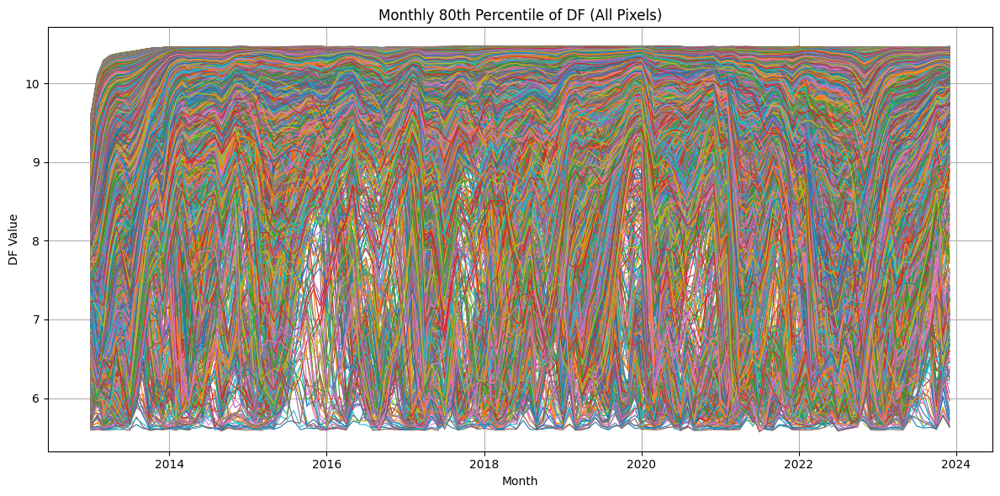

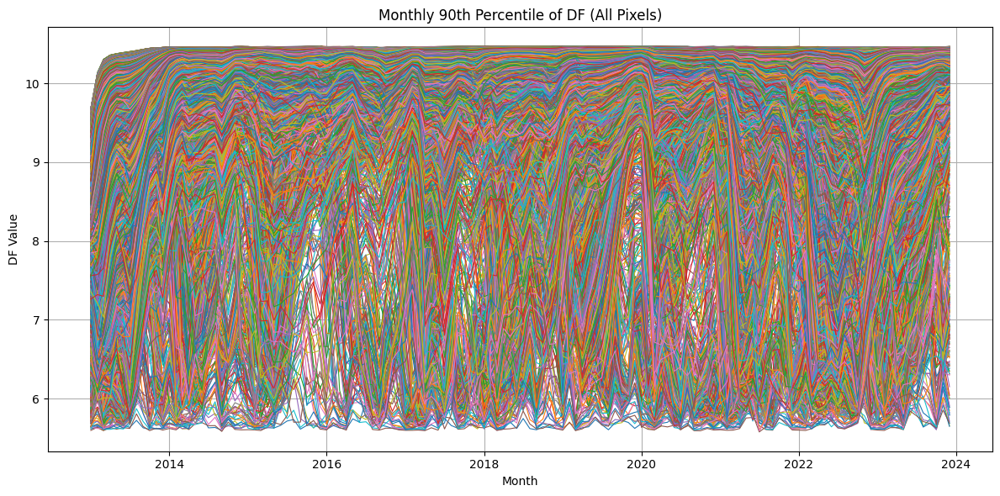

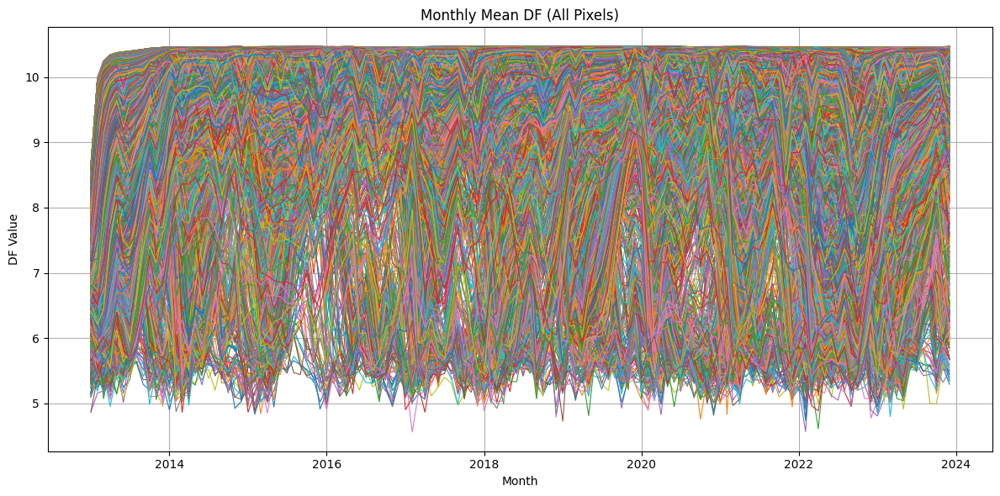

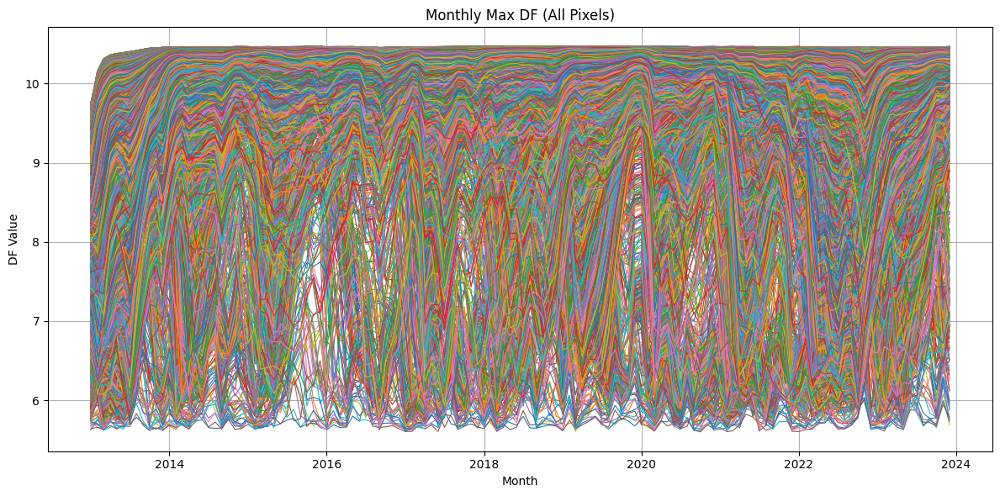

✅ Done! Plotted and saved 4 separate monthly DF trend graphs.


In [10]:
# Snippet to plot all 4 different types of drought factor
# ----------------------------
# User parameters
# ----------------------------
DF_DIR = Path("Outputs/DF_Output")  # Folder with DF NetCDFs (DF_Queensland_YYYY.nc)
START_YEAR = 2013
END_YEAR = 2023
OUTPUT_PLOT_DIR = Path("DF_Plots")
OUTPUT_PLOT_DIR.mkdir(exist_ok=True)

# ----------------------------
# 1) Load and concatenate DF NetCDFs
# ----------------------------
df_list = []
for year in range(START_YEAR, END_YEAR + 1):
    nc_file = DF_DIR / f"DF_Queensland_{year}.nc"
    print(f"Loading {nc_file}...")
    ds = xr.open_dataset(nc_file)
    df_da = ds["DF"]  # dims: valid_time x latitude x longitude
    df_list.append(df_da)

df_all = xr.concat(df_list, dim="valid_time").sortby("valid_time")

# ----------------------------
# 2) Resample from daily to monthly statistics per pixel
# ----------------------------
monthly_80   = df_all.resample(valid_time="MS").quantile(0.8, dim="valid_time", skipna=True)
monthly_90   = df_all.resample(valid_time="MS").quantile(0.9, dim="valid_time", skipna=True)
monthly_mean = df_all.resample(valid_time="MS").mean(dim="valid_time", skipna=True)
monthly_max  = df_all.resample(valid_time="MS").max(dim="valid_time", skipna=True)

# ----------------------------
# 3) Plot helper function
# ----------------------------
def plot_all_pixels(da, title_str, filename):
    """
    Plots each pixel's monthly timeseries from da (time, lat, lon) in one figure
    and saves the figure.
    """
    da_stacked = da.stack(pixel=("latitude", "longitude"))
    plt.figure(figsize=(12, 6))
    for px in da_stacked.pixel:
        series = da_stacked.sel(pixel=px)
        plt.plot(series.valid_time.values, series.values, linewidth=0.8)
    plt.title(title_str)
    plt.xlabel("Month")
    plt.ylabel("DF Value")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT_DIR / filename, dpi=150)
    plt.show()

# ----------------------------
# 4) Create & save each plot
# ----------------------------
plot_all_pixels(monthly_80, "Monthly 80th Percentile of DF (All Pixels)", "monthly_80.png")
plot_all_pixels(monthly_90, "Monthly 90th Percentile of DF (All Pixels)", "monthly_90.png")
plot_all_pixels(monthly_mean, "Monthly Mean DF (All Pixels)", "monthly_mean.png")
plot_all_pixels(monthly_max, "Monthly Max DF (All Pixels)", "monthly_max.png")

print("✅ Done! Plotted and saved 4 separate monthly DF trend graphs.")
